# Project 1: Learn Data Science using Wine Reviews Analysis
- Setup data science environment
- Data manipulation or preprocessing with Pandas
- Descriptive analysis and matrix calculation with NumPy
- Data visualization with Matplotlib

In [ ]:
#!pip install pandas

#!pip install matplotlib

#!pip install seaborn

# !pip install plotly

#!pip install scikit-learn

#!pip install statsmodels

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objs as go
import statsmodels.api as sm
import scipy.stats as stats
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.metrics import accuracy_score,confusion_matrix, classification_report,roc_auc_score
from sklearn.utils import resample
from sklearn.model_selection import train_test_split,KFold, GridSearchCV

In [8]:
data = pd.read_csv(r'C:\\Users\\DELL\\Desktop\\WineReview\\WineQT.csv')

In [9]:
data.shape

(1143, 13)

In [10]:
# check for missing values and impute if any 
data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
Id                      0
dtype: int64

In [11]:
# drop  unnecessary columns
data = data.drop(columns='Id',axis=1)

In [12]:
# Let's categorize the wine quality into 3 categories : 1 - Low quality Wine, 2 - Medium Quality Wine, 3 - High Quality Wine
data['quality'] = data['quality'].replace({3:1,4:1,
               5:2,6:2,7:3,8:3})

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 107.3 KB


In [14]:
data['quality'].value_counts()

quality
2    945
3    159
1     39
Name: count, dtype: int64

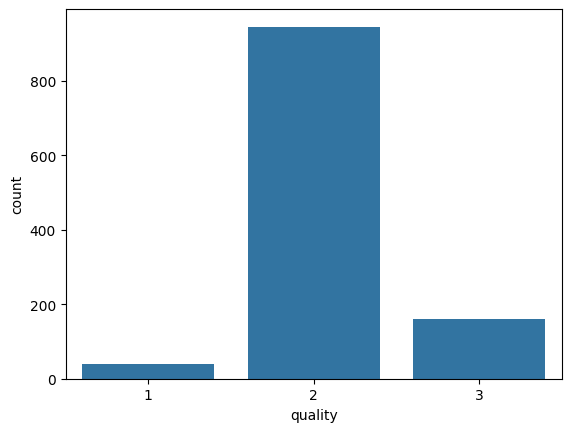

In [115]:
sns.countplot(data,x='quality')
plt.show()

- This is an **Imbalanced Dataset**.
- Let's upsample it to make the  minority classes 1 and 3 w.r.t majority class 2.

## Upsampling

In [16]:
class_1 = data[data['quality']==1]
class_2 = data[data['quality']==2]
class_3 = data[data['quality']==3]

In [17]:
class_2.shape

(945, 12)

In [18]:
# upsample minority
class_1_upsampled = resample(class_1,
                          replace=True, # sample with replacement
                          n_samples= len(class_2)-39,    #len(apple), # match number in majority class
                          random_state=67) # reproducible results

In [19]:
class_1_upsampled = class_1_upsampled.reset_index(drop=True)

In [20]:
class_1_upsampled.shape

(906, 12)

In [21]:
class_3_upsampled = resample(class_3,
                          replace=True, # sample with replacement
                          n_samples= len(class_2)-159,    #len(apple), # match number in majority class
                          random_state=67) # reproducible results

In [22]:
class_3_upsampled = class_3_upsampled.reset_index(drop=True)

In [23]:
frame = [data,class_1_upsampled,class_3_upsampled]
df = pd.concat(frame,axis=0)

In [24]:
df.shape

(2835, 12)

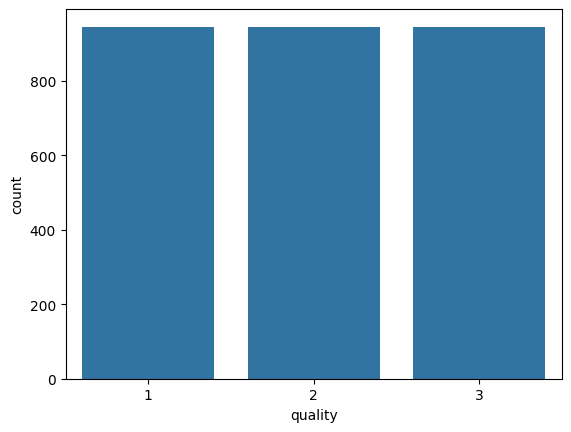

In [25]:
sns.countplot(df,x='quality')
plt.show()

In [26]:
X = df.iloc[:,:-1]
y = df.iloc[:,[-1]]

In [27]:
y['quality'] = y['quality'].astype('category')

C:\Users\DELL\AppData\Local\Temp\ipykernel_21076\2773976260.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['quality'] = y['quality'].astype('category')


In [28]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1143.0,8.311111,1.747595,4.60000,7.10000,7.90000,9.100000,15.90000
volatile acidity,1143.0,0.531339,0.179633,0.12000,0.39250,0.52000,0.640000,1.58000
citric acid,1143.0,0.268364,0.196686,0.00000,0.09000,0.25000,0.420000,1.00000
residual sugar,1143.0,2.532152,1.355917,0.90000,1.90000,2.20000,2.600000,15.50000
chlorides,1143.0,0.086933,0.047267,0.01200,0.07000,0.07900,0.090000,0.61100
free sulfur dioxide,1143.0,15.615486,10.250486,1.00000,7.00000,13.00000,21.000000,68.00000
total sulfur dioxide,1143.0,45.914698,32.782130,6.00000,21.00000,37.00000,61.000000,289.00000
density,1143.0,0.996730,0.001925,0.99007,0.99557,0.99668,0.997845,1.00369
pH,1143.0,3.311015,0.156664,2.74000,3.20500,3.31000,3.400000,4.01000
sulphates,1143.0,0.657708,0.170399,0.33000,0.55000,0.62000,0.730000,2.00000


In [29]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,2835.0,8.365115,1.876839,4.60000,7.1000,8.1000,9.3000,15.90000
volatile acidity,2835.0,0.559501,0.237905,0.12000,0.3800,0.5200,0.6800,1.58000
citric acid,2835.0,0.274589,0.219324,0.00000,0.0500,0.2600,0.4500,1.00000
residual sugar,2835.0,2.585785,1.304673,0.90000,1.9000,2.2000,2.6000,15.50000
chlorides,2835.0,0.087065,0.061492,0.01200,0.0660,0.0770,0.0890,0.61100
free sulfur dioxide,2835.0,14.674956,10.088392,1.00000,6.0000,12.0000,20.0000,68.00000
total sulfur dioxide,2835.0,40.412169,30.500192,6.00000,18.0000,31.0000,51.0000,289.00000
density,2835.0,0.996561,0.002013,0.99007,0.9952,0.9965,0.9978,1.00369
pH,2835.0,3.325919,0.175900,2.74000,3.2200,3.3200,3.4200,4.01000
sulphates,2835.0,0.673965,0.208502,0.33000,0.5500,0.6300,0.7600,2.00000


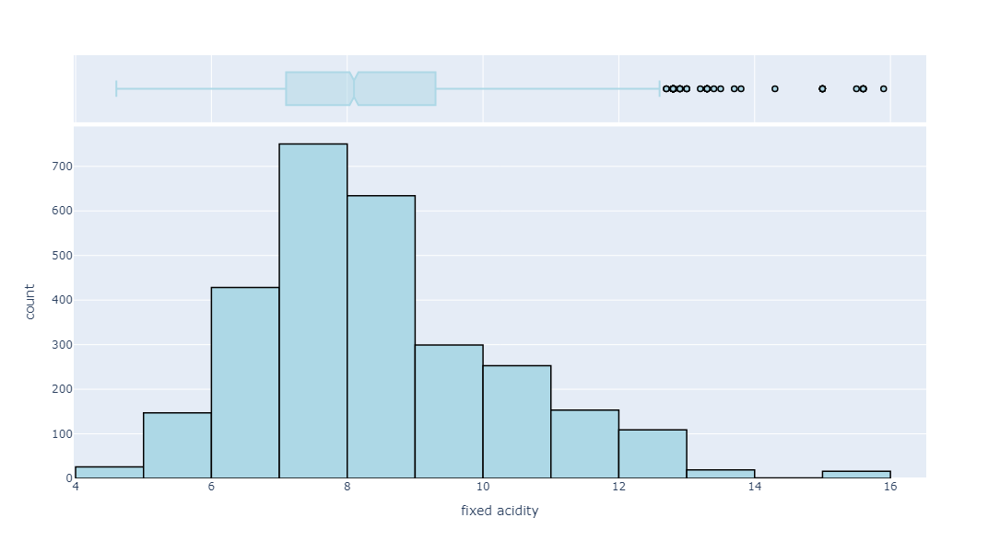

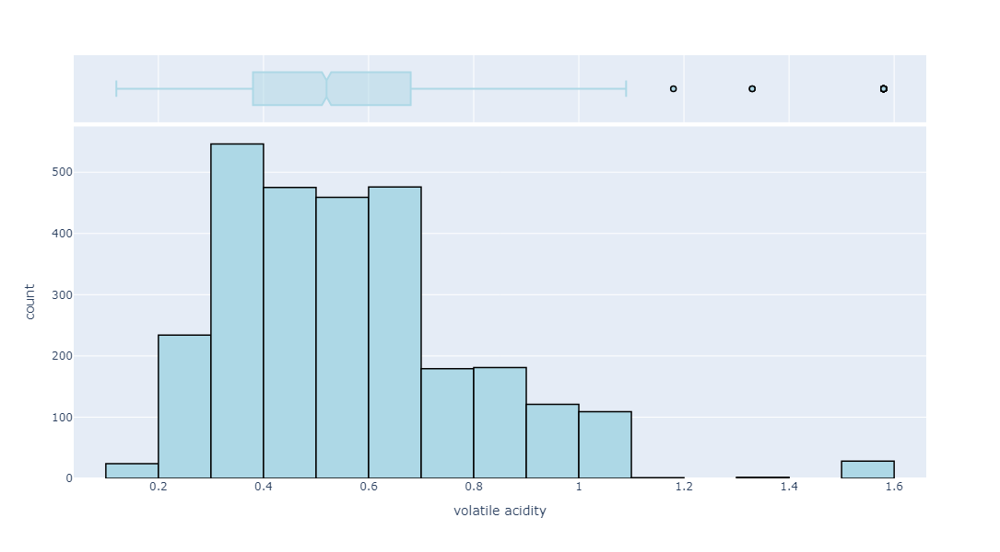

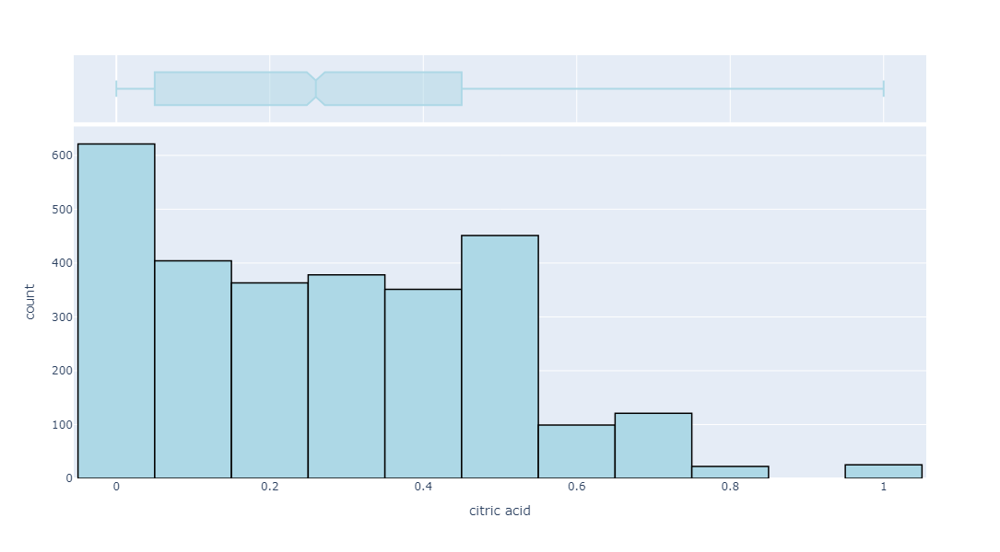

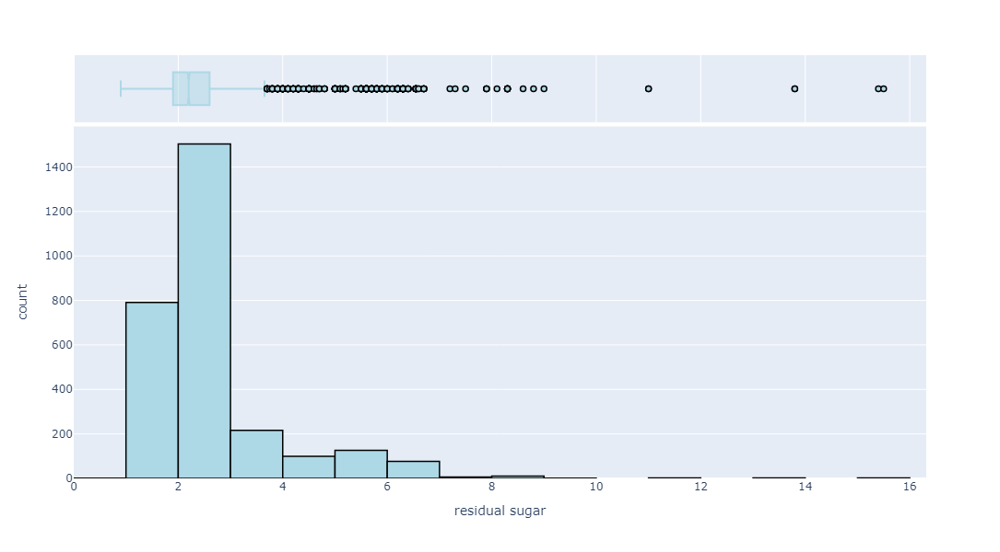

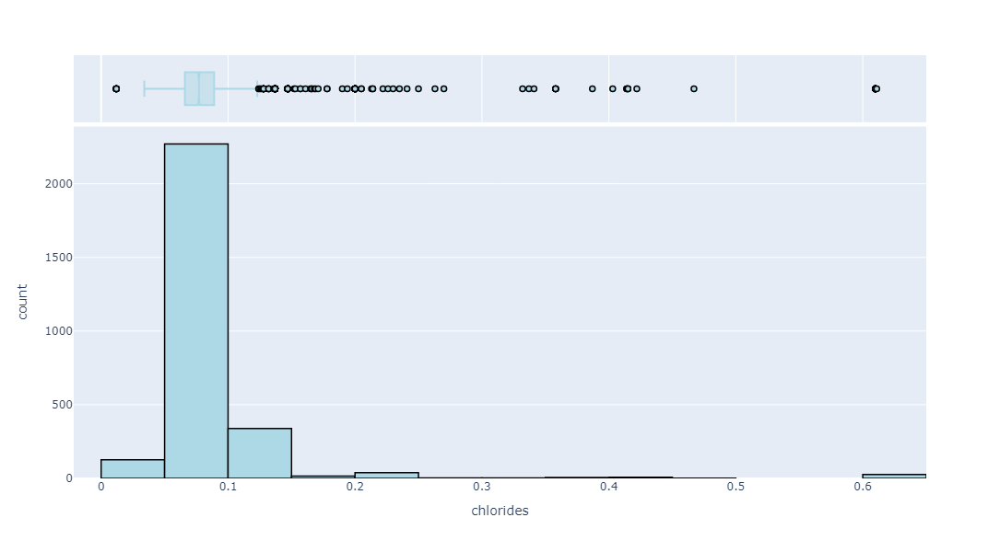

...

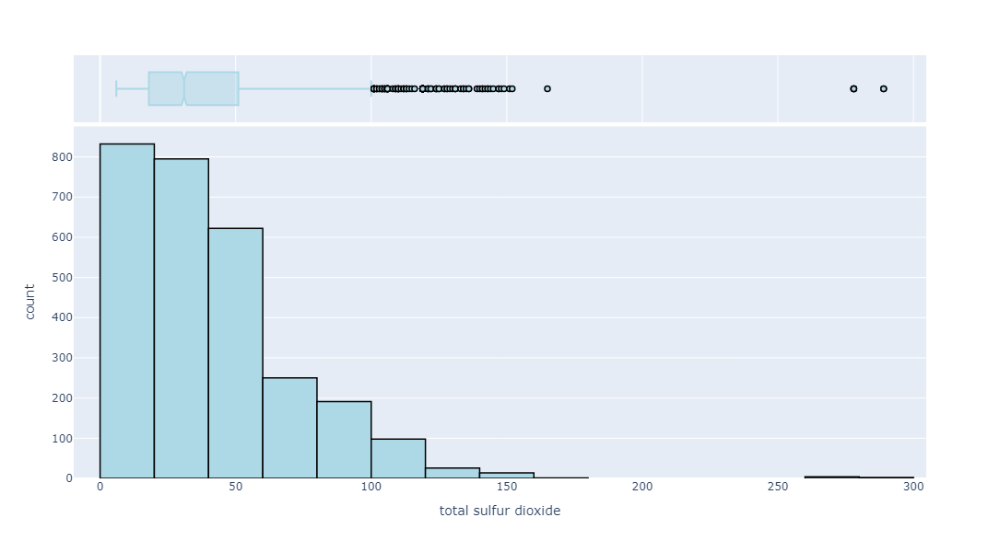

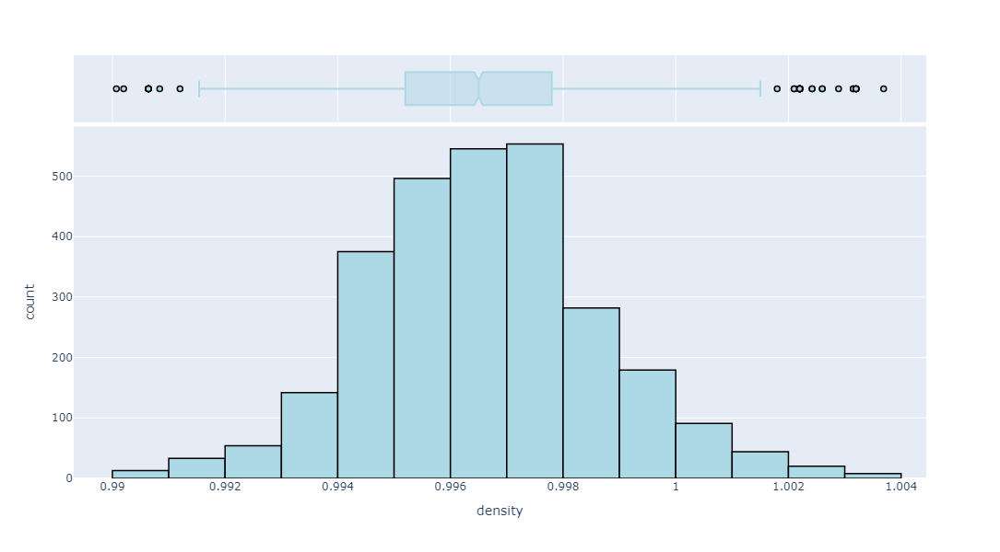

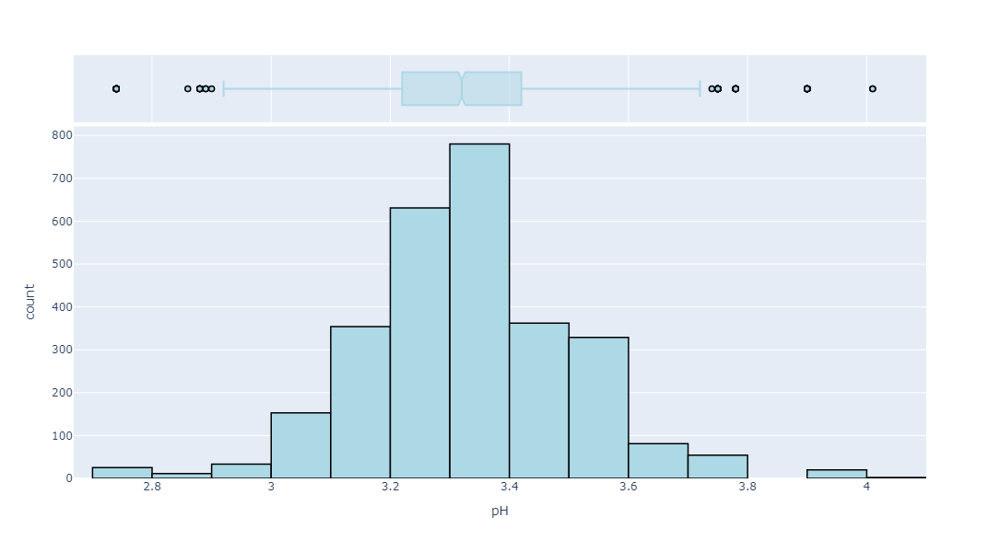

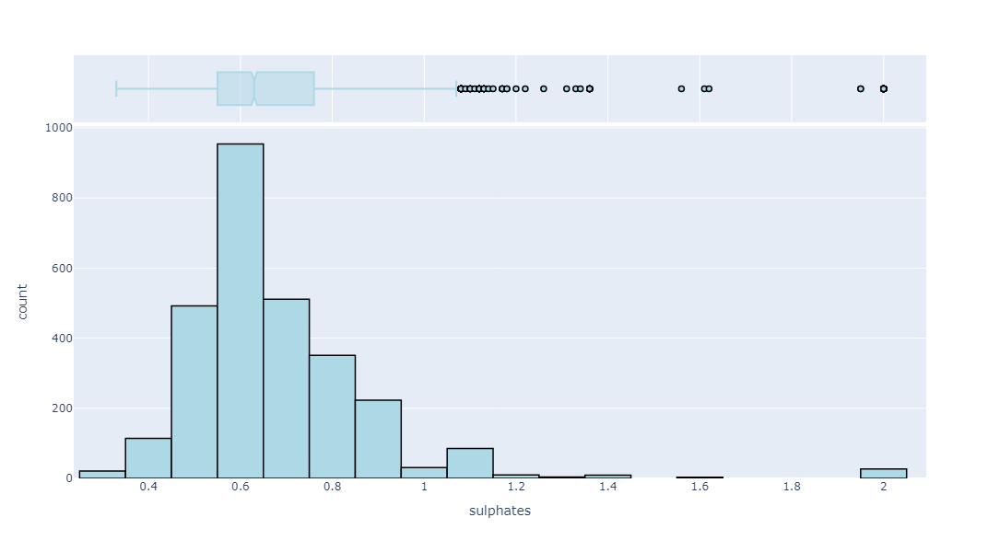

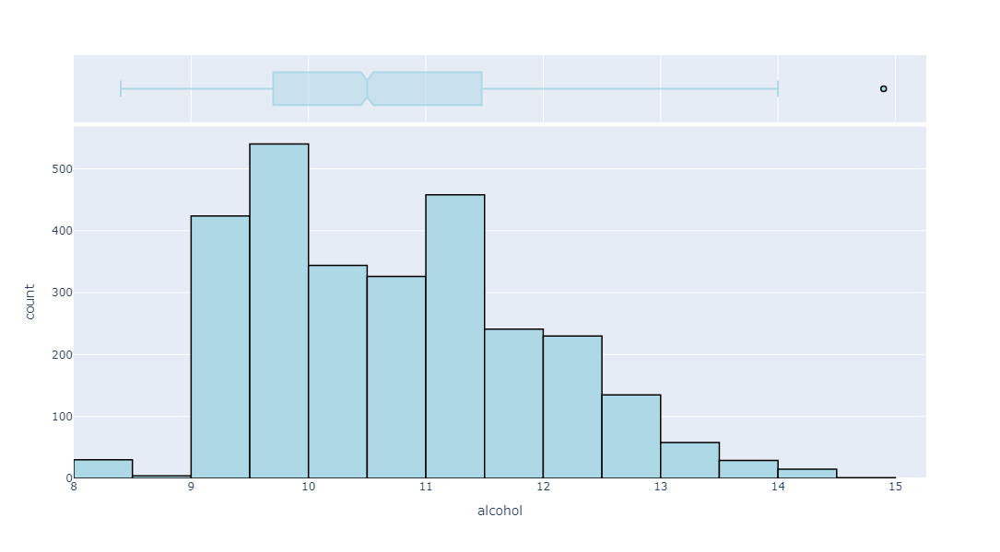

In [30]:
import plotly.express as px
# Assuming your data is in a pandas DataFrame called 'data'
for col in data.columns[:-1]:
    fig = px.histogram(df, x=col, nbins=20,
                       color_discrete_sequence=['lightblue'],
                       marginal='box',
                       hover_data=data.columns,
                       labels={'value': 'Count'},
                       width=800, height=600)
    # Customize marker and edge color
    fig.update_traces(marker_color='lightblue', marker_line_color='black', marker_line_width=1.5)
    
    # Show the plot
    fig.show()

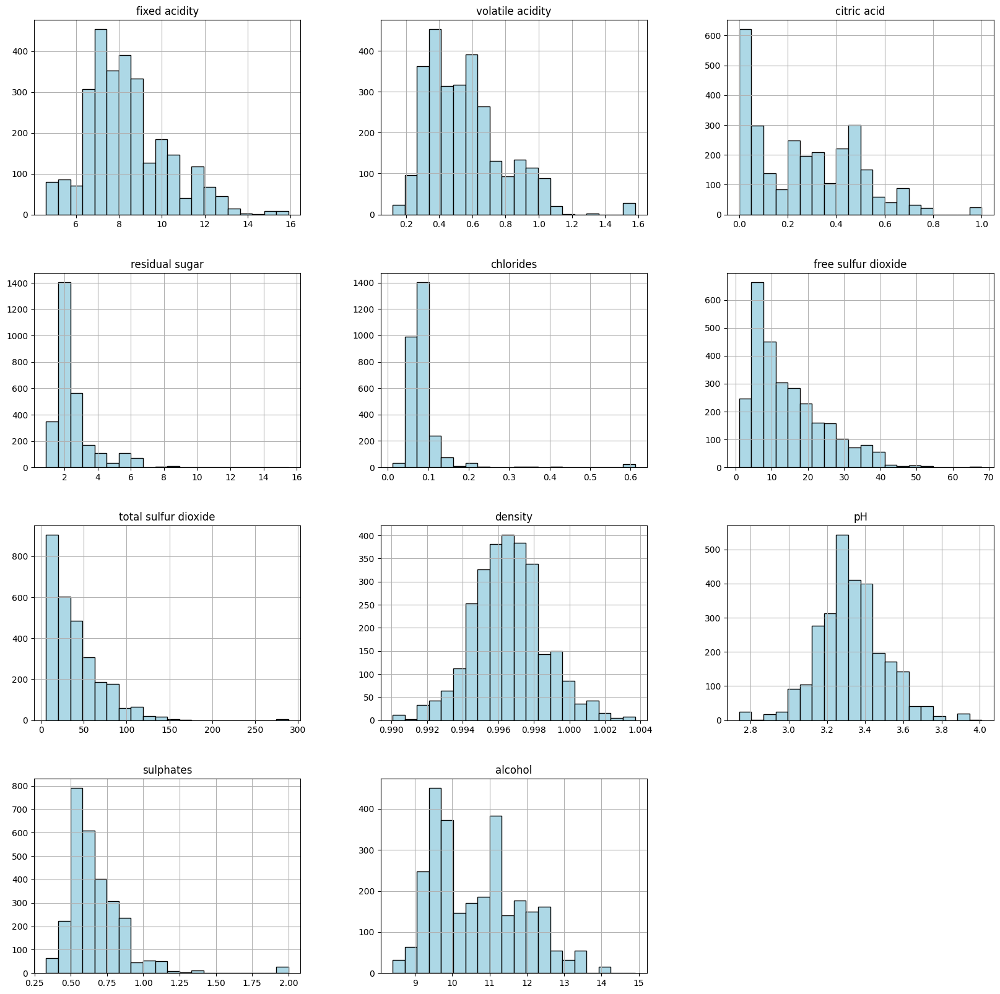

In [31]:
#Distribution of the independent variables
X.hist(bins=20, figsize=(20,20), color='lightblue', edgecolor = 'black')
plt.show()

- Fixed Acidity, Volaitile Acidity:column values are  slightly skewed
-  Citric Acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, Sulphates, alcohol highly skewed
-  density, PH : column values are quiet normally distributed.

In [32]:
# Get numeric columns
numeric_cols = [col for col in X.columns[:-1] if X[col].dtype.kind in 'bifc']

# Calculate skewness for numeric columns
skewness = [stats.skew(X[col].dropna()) for col in numeric_cols]

# Create the DataFrame
Skewness = pd.DataFrame({'Skewness': skewness}, index=numeric_cols)

In [33]:
Skewness.sort_values(by=['Skewness'],ascending = False)

,Skewness
chlorides,6.478161
residual sugar,2.947784
sulphates,2.904521
total sulfur dioxide,2.016024
volatile acidity,1.123113
free sulfur dioxide,1.118436
fixed acidity,0.753421
citric acid,0.517472
density,0.178471
pH,0.127465


From the above plot, it can be seen most of the attributes are normally distributed with few skewed to the right and left.

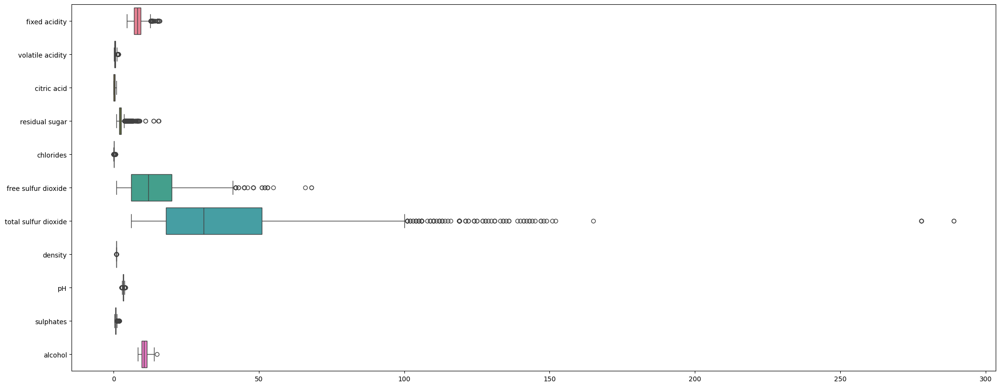

In [34]:
#boxplot distribution of the independent variables
plt.figure(figsize= (25,10))
sns.boxplot(data=X,orient ="h")
plt.show()

total sulfur dioxide is having a huge effect on our data distribution since is having a wider measurement of scale. We will therefore drop that and visualise it alone while we visualise the rest of the data set.

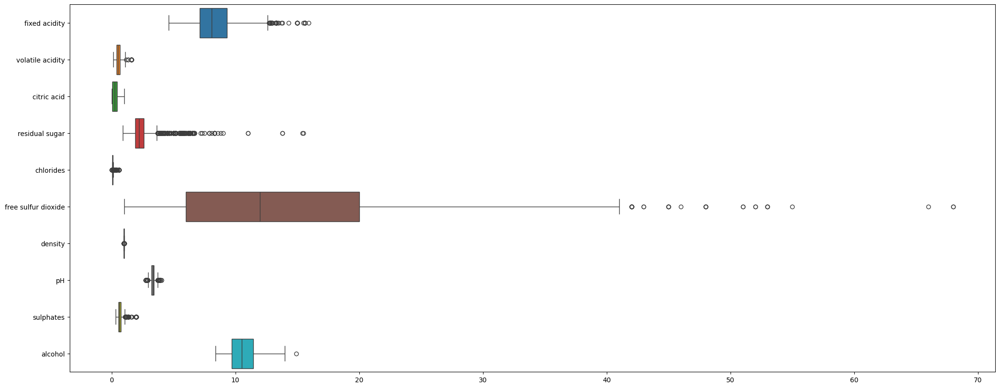

In [35]:
#boxplot distribution of the independent variables without Scaled_variance_1 

plt.figure(figsize= (25,10))
sns.boxplot(data=X.drop('total sulfur dioxide',axis=1),orient="h")
plt.show()

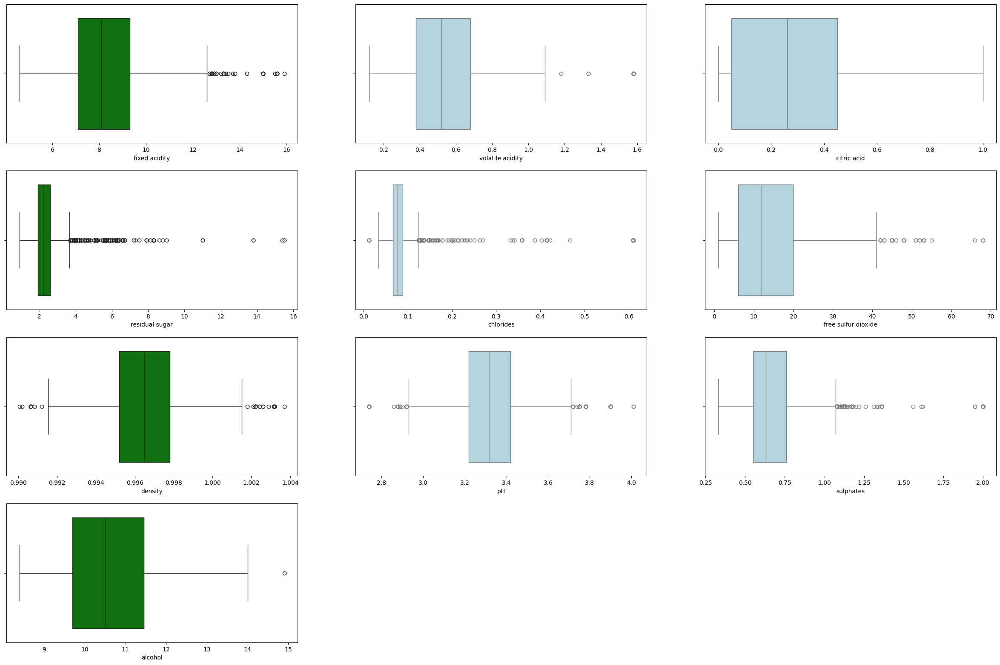

In [36]:
#Distribution of variables with most outliers

plt.figure(figsize= (30,50))
plt.subplot(10,3,1)
sns.boxplot(x= X['fixed acidity'], color='green')

plt.subplot(10,3,2)
sns.boxplot(x= X['volatile acidity'], color='lightblue')

plt.subplot(10,3,3)
sns.boxplot(x= X['citric acid'], color='lightblue')

#Distribution of variables with most outliers
plt.subplot(10,3,4)
sns.boxplot(x= X['residual sugar'], color='green')

plt.subplot(10,3,5)
sns.boxplot(x= X['chlorides'], color='lightblue')

plt.subplot(10,3,6)
sns.boxplot(x= X['free sulfur dioxide'], color='lightblue')

plt.subplot(10,3,7)
sns.boxplot(x= X['density'], color='green')

plt.subplot(10,3,8)
sns.boxplot(x= X['pH'], color='lightblue')

plt.subplot(10,3,9)
sns.boxplot(x= X['sulphates'], color='lightblue')

plt.subplot(10,3,10)
sns.boxplot(x=X['alcohol'],color='green')

plt.show()

In [37]:
data_df = df.iloc[:,:-1]

In [38]:
Q1 = data_df.quantile(0.25)

In [39]:
Q3 = data_df.quantile(0.75)

In [40]:
IQR = Q3 - Q1

In [41]:
print(IQR)

fixed acidity            2.2000
volatile acidity         0.3000
citric acid              0.4000
residual sugar           0.7000
chlorides                0.0230
free sulfur dioxide     14.0000
total sulfur dioxide    33.0000
density                  0.0026
pH                       0.2000
sulphates                0.2100
alcohol                  1.7500
dtype: float64


In [42]:
df2 = data_df[~((data_df < (Q1-1.5*IQR))| (data_df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [43]:
df2.shape

(1984, 11)

In [44]:
# Calculate Percent of data removed by this method:
Outlier_Percent = round((data_df.shape[0] - df2.shape[0])/(data_df.shape[0]),2) *100

In [45]:
Outlier_Percent

30.0

We can see that 30% of data is outliers. If we trim them that much amount of data will be lost.

## Scaling

In [46]:
# Let's scale the data check again
#We transform (centralize) the entire X (independent variable data) to normalize it using standardscalar through transformation.
sdsc = StandardScaler()
X_scaled =  sdsc.fit_transform(X)

In [47]:
X_scaled_df = pd.DataFrame(X_scaled,columns= X.columns)

## Winsorization replaces extreme outliers with nearest non-outlier values. 

In [49]:
def winsorise(df, variable, upper_limit, lower_limit):
    return np.where(df[variable] > upper_limit, upper_limit, 
                    np.where(df[variable] < lower_limit, lower_limit, df[variable]))

In [50]:
X_scaled_df['volatile acidity'] = winsorise(X_scaled_df,'volatile acidity',X_scaled_df['volatile acidity'].quantile(0.95),
                                         X_scaled_df['volatile acidity'].quantile(0.05))

In [51]:
X_scaled_df['citric acid'] = winsorise(X_scaled_df,'citric acid',X_scaled_df['citric acid'].quantile(0.95),
                                         X_scaled_df['citric acid'].quantile(0.05))

In [52]:
X_scaled_df['residual sugar'] = winsorise(X_scaled_df,'residual sugar',X_scaled_df['residual sugar'].quantile(0.95),
                                         X_scaled_df['residual sugar'].quantile(0.05))

In [53]:
X_scaled_df['chlorides'] = winsorise(X_scaled_df,'chlorides',X_scaled_df['chlorides'].quantile(0.95),
                                         X_scaled_df['chlorides'].quantile(0.05))

In [54]:
X_scaled_df['free sulfur dioxide'] = winsorise(X_scaled_df,'free sulfur dioxide',X_scaled_df['free sulfur dioxide'].quantile(0.95),
                                         X_scaled_df['free sulfur dioxide'].quantile(0.05))

In [55]:
X_scaled_df['total sulfur dioxide'] = winsorise(X_scaled_df,'total sulfur dioxide',X_scaled_df['total sulfur dioxide'].quantile(0.95),
                                         X_scaled_df['total sulfur dioxide'].quantile(0.05))

In [56]:
X_scaled_df['density'] = winsorise(X_scaled_df,'density',X_scaled_df['density'].quantile(0.95),
                                         X_scaled_df['density'].quantile(0.05))

In [57]:
X_scaled_df['pH'] = winsorise(X_scaled_df,'pH',X_scaled_df['pH'].quantile(0.95),
                                         X_scaled_df['pH'].quantile(0.05))

In [58]:
X_scaled_df['sulphates'] = winsorise(X_scaled_df,'sulphates',X_scaled_df['sulphates'].quantile(0.95),
                                         X_scaled_df['sulphates'].quantile(0.05))

In [59]:
X_scaled_df['alcohol'] = winsorise(X_scaled_df,'alcohol',X_scaled_df['alcohol'].quantile(0.95),
                                         X_scaled_df['alcohol'].quantile(0.05))

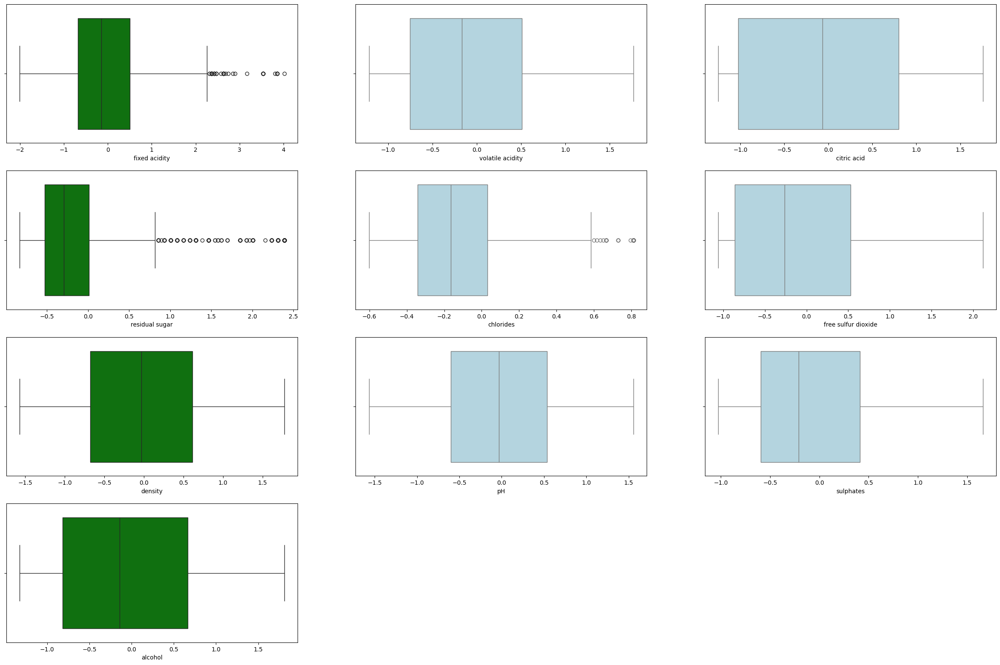

In [60]:
plt.figure(figsize= (30,50))
plt.subplot(10,3,1)
sns.boxplot(x= X_scaled_df['fixed acidity'], color='green')

plt.subplot(10,3,2)
sns.boxplot(x= X_scaled_df['volatile acidity'], color='lightblue')

plt.subplot(10,3,3)
sns.boxplot(x= X_scaled_df['citric acid'], color='lightblue')


plt.subplot(10,3,4)
sns.boxplot(x= X_scaled_df['residual sugar'], color='green')

plt.subplot(10,3,5)
sns.boxplot(x= X_scaled_df['chlorides'], color='lightblue')

plt.subplot(10,3,6)
sns.boxplot(x= X_scaled_df['free sulfur dioxide'], color='lightblue')

plt.subplot(10,3,7)
sns.boxplot(x= X_scaled_df['density'], color='green')

plt.subplot(10,3,8)
sns.boxplot(x= X_scaled_df['pH'], color='lightblue')

plt.subplot(10,3,9)
sns.boxplot(x= X_scaled_df['sulphates'], color='lightblue')

plt.subplot(10,3,10)
sns.boxplot(x=X_scaled_df['alcohol'],color='green')

plt.show()

We can see that residual sugars have still some outliers. Let's do the winsorisation again

In [109]:
X_scaled_df['residual sugar'] = winsorise(X_scaled_df,'residual sugar',X_scaled_df['residual sugar'].quantile(0.85),
                                         X_scaled_df['residual sugar'].quantile(0.15))

In [62]:
X_scaled_df['chlorides'] = winsorise(X_scaled_df,'chlorides',X_scaled_df['chlorides'].quantile(0.9),
                                         X_scaled_df['chlorides'].quantile(0.1))

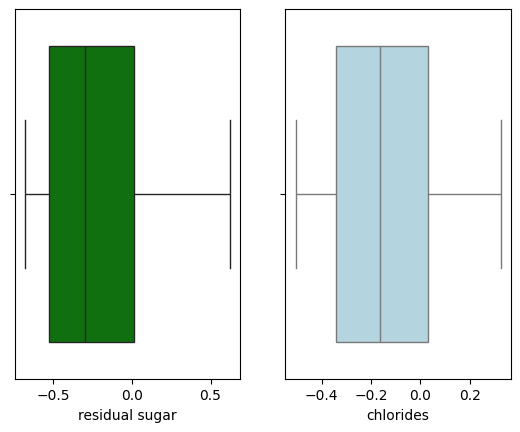

In [110]:
plt.subplot(1,2,1)
sns.boxplot(x= X_scaled_df['residual sugar'], color='green')

plt.subplot(1,2,2)
sns.boxplot(x= X_scaled_df['chlorides'], color='lightblue')
plt.show()

In [ ]:
# Create Correlation Metric
corr_df = X_scaled_df.corr()
corr_df

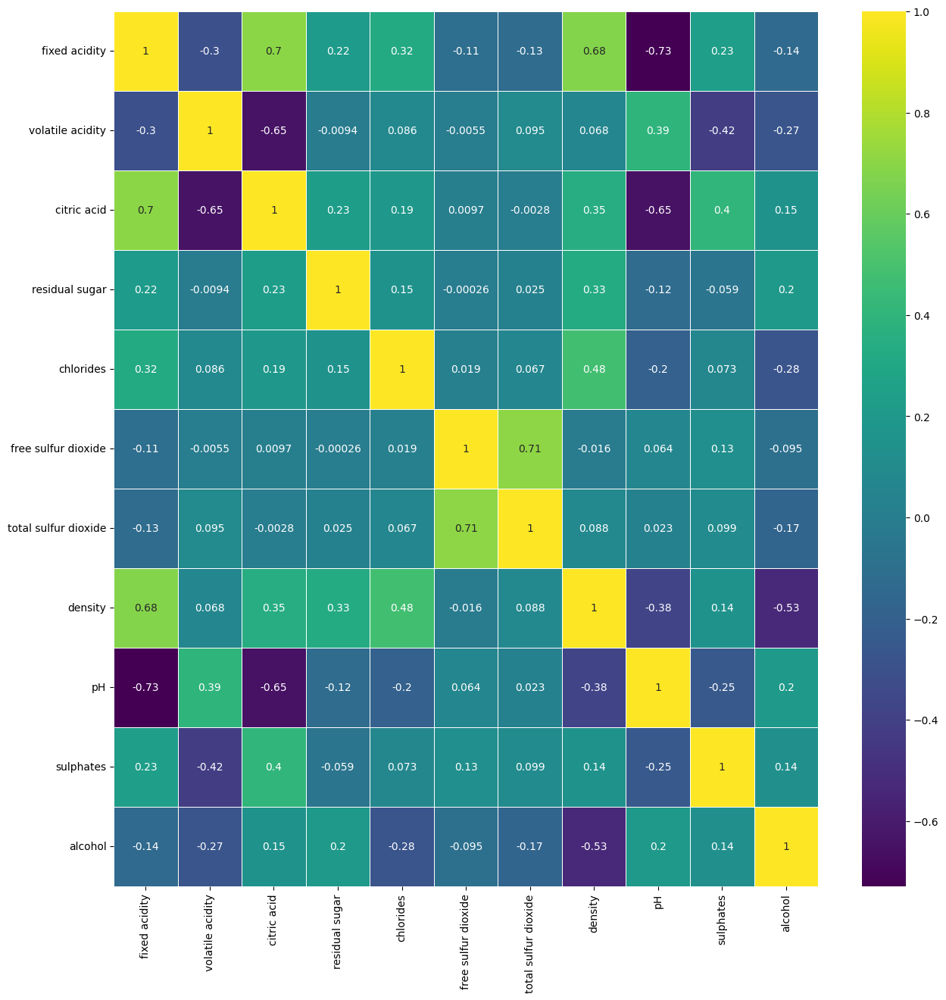

In [66]:
# set figure size and Plot the heatmap corresponding to correlation metric
plt.figure(figsize=(15,15))
Heatmap = sns.heatmap(corr_df, annot=True,linewidth=0.5,cmap='viridis')

In [67]:
# Do the train test split
X_train,X_test,y_train,y_test = train_test_split(X_scaled_df,
                                                y,test_size=0.3,random_state=0)
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)

In [68]:
print(X_train.shape)

(1984, 11)


In [69]:
print(X_test.shape)

(851, 11)


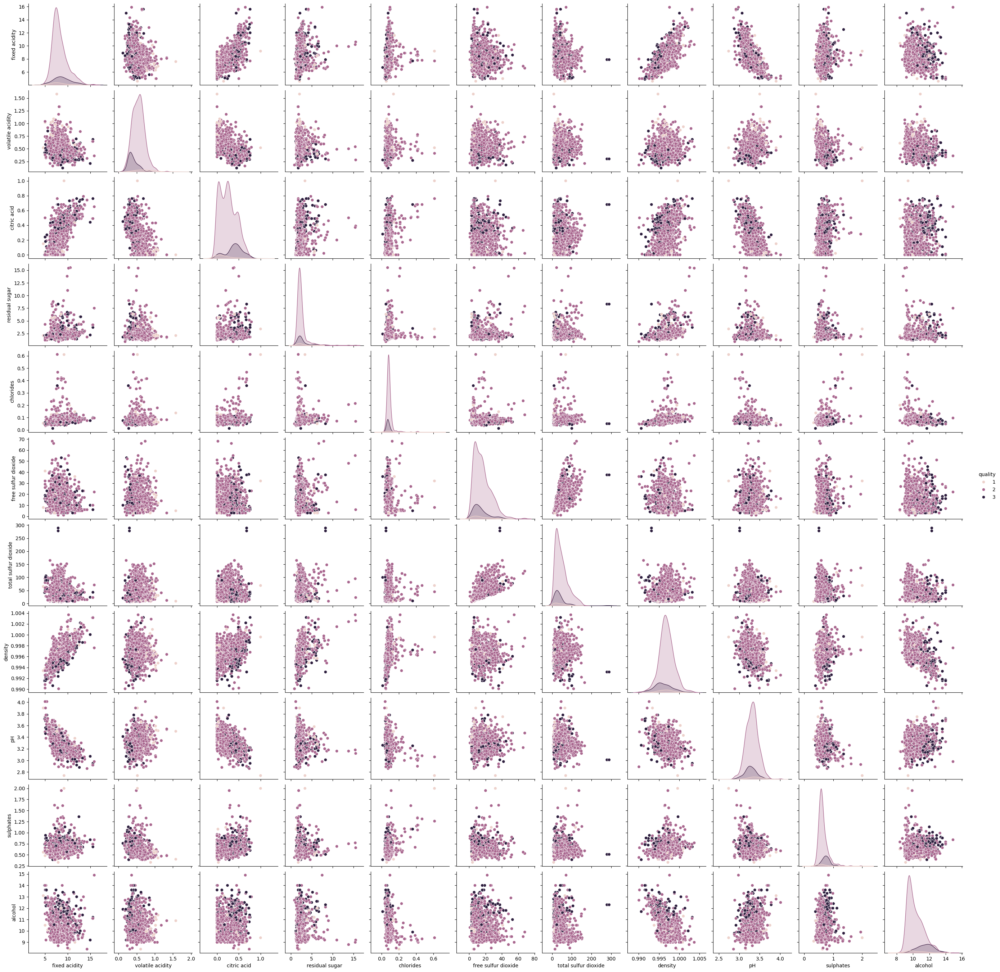

In [70]:
# create a scatter matrix from the dataframe, color by y_train
grr = sns.pairplot(data,hue='quality')

In [72]:
#print highly correlated variables
corr_features =[]

for i , r in data.corr().iterrows():
    k=0 #counter
    for j in range(len(r)):
        if i!= r.index[k]:
            if r.values[k] >=0.5:
                corr_features.append([i, r.index[k], r.values[k]])
        k += 1
corr_features

[['fixed acidity', 'citric acid', 0.6731572507629235],
 ['fixed acidity', 'density', 0.6815008826691703],
 ['citric acid', 'fixed acidity', 0.6731572507629235],
 ['free sulfur dioxide', 'total sulfur dioxide', 0.6610928721834333],
 ['total sulfur dioxide', 'free sulfur dioxide', 0.6610928721834333],
 ['density', 'fixed acidity', 0.6815008826691703]]

- There is correlation between fixed acidity and citric acid: 0.67
- There is correlation between fixed acidity and density: 0.68
- There is correlation between fixed acidity and pH: 0.69
- There is correlation between free sulfur dioxide and total sulfur dioxide: 0.66

In [73]:
#Getting the confusion matrix
covMatrix = np.cov(X_scaled_df,rowvar=False)
print(covMatrix)

[[ 1.00035286e+00 -2.68145269e-01  6.62449939e-01  1.34174155e-01
   8.36786788e-02 -1.03236125e-01 -1.07547732e-01  6.05057537e-01
  -6.20417595e-01  1.65709679e-01 -1.28508467e-01]
 [-2.68145269e-01  7.81015181e-01 -5.42128096e-01 -5.18413180e-03
   1.96868789e-02 -4.53670343e-03  7.15240199e-02  5.35049756e-02
   2.97172533e-01 -2.62359542e-01 -2.27103702e-01]
 [ 6.62449939e-01 -5.42128096e-01  8.99316302e-01  1.34764299e-01
   4.79644266e-02  8.59203618e-03 -2.28298598e-03  2.95506150e-01
  -5.26932203e-01  2.69766880e-01  1.35226751e-01]
 [ 1.34174155e-01 -5.18413180e-03  1.34764299e-01  3.86728238e-01
   2.48104629e-02 -1.53639901e-04  1.33143380e-02  1.82526734e-01
  -6.44329462e-02 -2.61509155e-02  1.18104485e-01]
 [ 8.36786788e-02  1.96868789e-02  4.79644266e-02  2.48104629e-02
   6.74478577e-02  4.56935221e-03  1.48034935e-02  1.10303422e-01
  -4.34139361e-02  1.34658002e-02 -6.79608211e-02]
 [-1.03236125e-01 -4.53670343e-03  8.59203618e-03 -1.53639901e-04
   4.56935221e-03  

In [74]:
covMatrix.shape #shape of the confusion matrix

(11, 11)

In [75]:
#Performing PCA on all the 18 components
from sklearn.decomposition import PCA
pca = PCA(n_components=11)
pca.fit(X_scaled_df)

PCA(n_components=11)

In [76]:
# The eigen Values
print(pca.explained_variance_)

[2.70651664 1.54985312 1.34724743 0.60514186 0.40605402 0.31198055
 0.25592323 0.21395901 0.14539977 0.05621465 0.04915424]


In [77]:
# The eigen Vectors
print(pca.components_)

[[ 0.55620399 -0.29186326  0.50214273  0.09595582  0.04943921 -0.04173941
  -0.03398888  0.34676153 -0.42738051  0.17610765 -0.06960534]
 [ 0.06654289  0.35282581 -0.16930599 -0.00144977  0.06529184  0.38515172
   0.41514671  0.40014676 -0.0277298  -0.07799918 -0.59202826]
 [-0.1495966  -0.31463832  0.21226887 -0.0021358  -0.03318233  0.62565217
   0.49329787 -0.24435617  0.01658213  0.23472317  0.28739623]
 [ 0.17668972  0.37487838  0.05485398  0.61168475  0.0420409   0.06201029
   0.09886895  0.2629481   0.21479763 -0.19024185  0.53312314]
 [-0.09602981 -0.01689448 -0.08019815 -0.02499549  0.05289123 -0.11695976
  -0.06599174  0.3809375   0.44079074  0.78921105  0.01845057]
 [ 0.31022735  0.5956118  -0.12625583 -0.39385138 -0.01365302  0.02259498
   0.06188221 -0.2290159  -0.34666282  0.33175011  0.30122792]
 [-0.38732341  0.05299111 -0.00105048  0.35721439 -0.00487939 -0.50945659
   0.4813708  -0.07892685 -0.41929792  0.20415204 -0.06755276]
 [-0.10197425 -0.02882933 -0.35638537  0.

In [78]:
print(pca.explained_variance_ratio_) #the variance in the Eigen vectors that we can explain. This can be visualised in the next cell below

[0.35391125 0.20266288 0.17616962 0.07912994 0.05309669 0.0407954
 0.0334652  0.02797784 0.01901286 0.00735078 0.00642754]


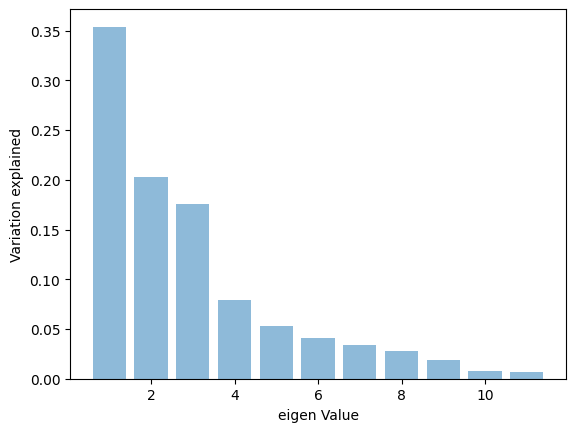

In [79]:
#visualisation of the explained variance in the Eigen vectors

plt.bar(list(range(1,12)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

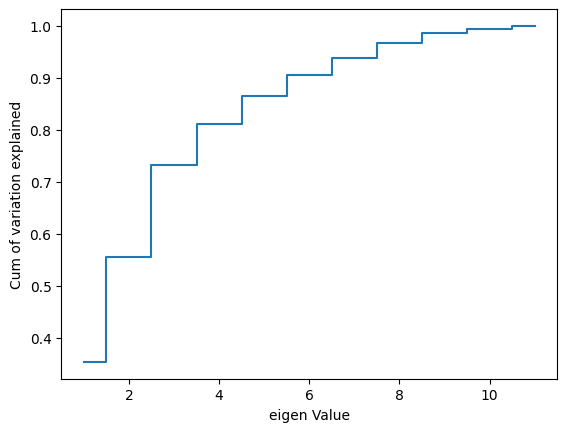

In [80]:
#Elbow visualisation of variance in the Eigen vectors
plt.step(list(range(1,12)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

# Dimensionality Reduction Using Principal Component Analysis
Now 8 dimensions seems very reasonable. With 8 variables we can explain over 95% of the variation in the original data!

In [81]:
#Using only 8 Eigen vectors that can be explained instead of the 11 vectors

pca3 = PCA(n_components=8)
pca3.fit(X_scaled_df)
print(pca3.components_)
print(pca3.explained_variance_ratio_)
Xpca3 = pca3.transform(X_scaled_df)

[[ 0.55620399 -0.29186326  0.50214273  0.09595582  0.04943921 -0.04173941
  -0.03398888  0.34676153 -0.42738051  0.17610765 -0.06960534]
 [ 0.06654289  0.35282581 -0.16930599 -0.00144977  0.06529184  0.38515172
   0.41514671  0.40014676 -0.0277298  -0.07799918 -0.59202826]
 [-0.1495966  -0.31463832  0.21226887 -0.0021358  -0.03318233  0.62565217
   0.49329787 -0.24435617  0.01658213  0.23472317  0.28739623]
 [ 0.17668972  0.37487838  0.05485398  0.61168475  0.0420409   0.06201029
   0.09886895  0.2629481   0.21479763 -0.19024185  0.53312314]
 [-0.09602981 -0.01689448 -0.08019815 -0.02499549  0.05289123 -0.11695976
  -0.06599174  0.3809375   0.44079074  0.78921105  0.01845057]
 [ 0.31022735  0.5956118  -0.12625583 -0.39385138 -0.01365302  0.02259498
   0.06188221 -0.2290159  -0.34666282  0.33175011  0.30122792]
 [-0.38732341  0.05299111 -0.00105048  0.35721439 -0.00487939 -0.50945659
   0.4813708  -0.07892685 -0.41929792  0.20415204 -0.06755276]
 [-0.10197425 -0.02882933 -0.35638537  0.

In [82]:
Xpca3 #now we have only 8 variables instead of 11

array([[-1.35582973e+00,  1.06681424e+00, -1.23055364e+00, ...,
        -4.78303115e-01, -3.39548783e-01, -2.61976715e-01],
       [-8.24819193e-01,  1.95903875e+00,  2.13299940e-01, ...,
         9.38484316e-01,  4.94669594e-01,  8.01176036e-01],
       [-6.93695452e-01,  1.22682250e+00, -4.68493836e-01, ...,
         4.69334866e-01,  5.05668742e-01,  2.84211882e-01],
       ...,
       [-2.23525381e-03, -5.51997944e-01,  1.65352922e+00, ...,
        -2.71712010e-01, -2.68852433e-01,  4.34282311e-02],
       [ 7.25805551e-01, -2.11827381e+00,  1.09321144e+00, ...,
         6.09729062e-01, -3.54262413e-02, -5.86666893e-03],
       [-2.84014969e+00, -1.10598542e+00,  2.20346106e+00, ...,
         6.13531304e-02,  4.75803298e-01, -8.00283434e-01]])

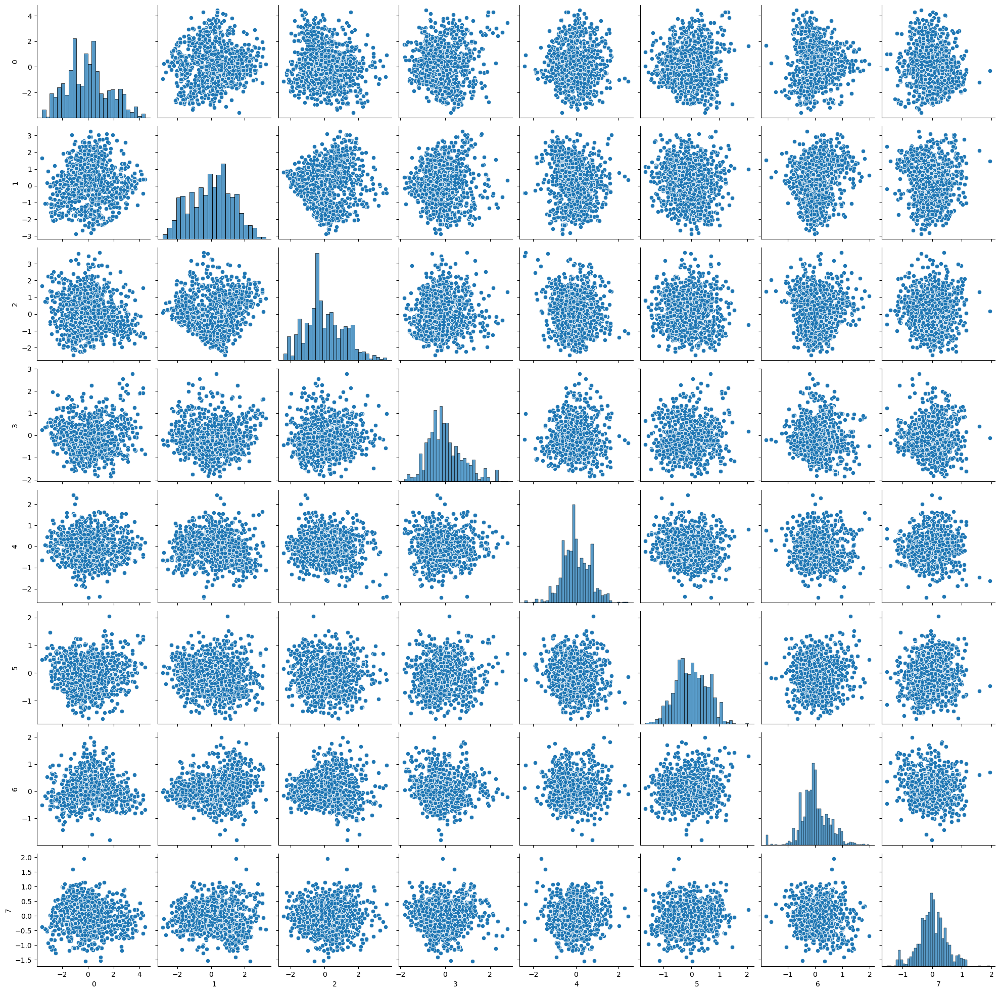

In [83]:
#pairplot of the new variables showing no correlation
sns.pairplot(pd.DataFrame(Xpca3))
plt.show()

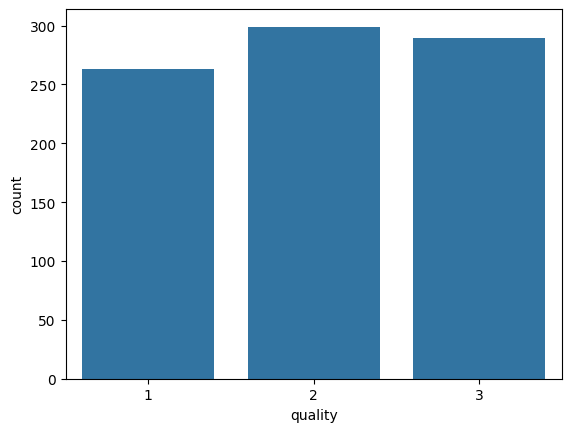

In [84]:
sns.countplot(y_test,x='quality')
plt.show()

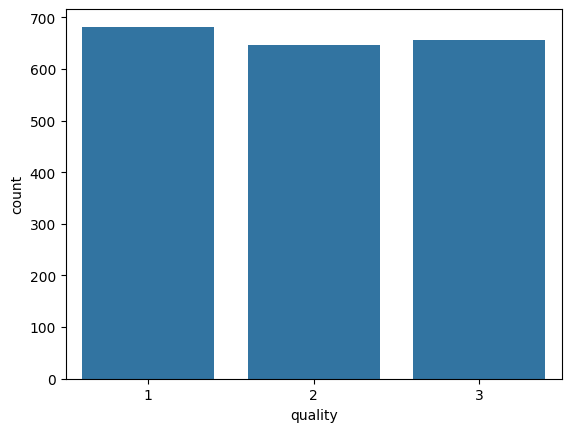

In [85]:
sns.countplot(y_train,x='quality')
plt.show()

# Model Building
* Original Scaled data

## Support Vector Machines 

In [86]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.svm import SVC

# Original data
svc = SVC()
svc.fit(X_train,y_train)
Orig_y_predict = svc.predict(X_test) #predict on test data
svc.score(X_test, y_test)

0.8331374853113983

In [87]:
# Calculate Confusion Matrix & PLot To Visualize it
def draw_confmatrix(y_test, yhat, str1, str2, str3, datatype):
    #Make predictions and evalute
    #model_pred = fit_test_model(model,X_train, y_train, X_test)
    cm = confusion_matrix(y_test, yhat, labels=[str1,str2,str3])
    print("Confusion Matrix For :", "\n",datatype,"\n",cm )
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [str1, str2,str3] , yticklabels = [str1, str2,str3] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

Confusion Matrix For : 
 Original Data Set 
 [[246  17   0]
 [ 35 204  60]
 [  7  23 259]]


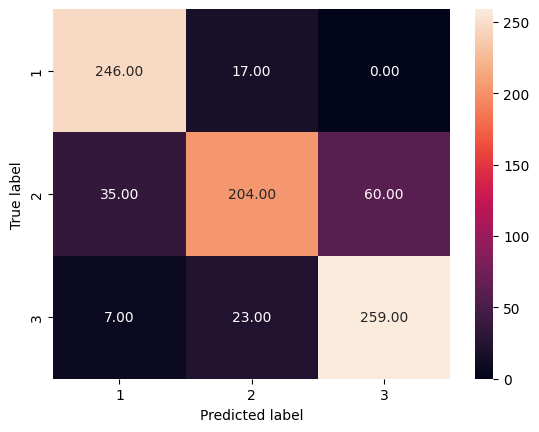

In [88]:
draw_confmatrix(y_test, Orig_y_predict,1,2,3, "Original Data Set")

In [89]:
#Classification Report Of Model built on Raw Data
print("Classification Report For Raw Data:", "\n", classification_report(y_test,Orig_y_predict))

Classification Report For Raw Data: 
               precision    recall  f1-score   support

           1       0.85      0.94      0.89       263
           2       0.84      0.68      0.75       299
           3       0.81      0.90      0.85       289

    accuracy                           0.83       851
   macro avg       0.83      0.84      0.83       851
weighted avg       0.83      0.83      0.83       851



* Data After PCA transformation is applied

In [90]:
# PCA Data
pca_X_train,pca_X_test,pca_y_train,pca_y_test = train_test_split(Xpca3,y,test_size=0.30,random_state=0)

In [91]:
svc.fit(pca_X_train,pca_y_train)
pca_y_predict = svc.predict(pca_X_test) #predict on test data

0.81786133960047

Confusion Matrix For : 
 Reduced Dimensions Using PCA  
 [[246  17   0]
 [ 38 195  66]
 [ 11  23 255]]


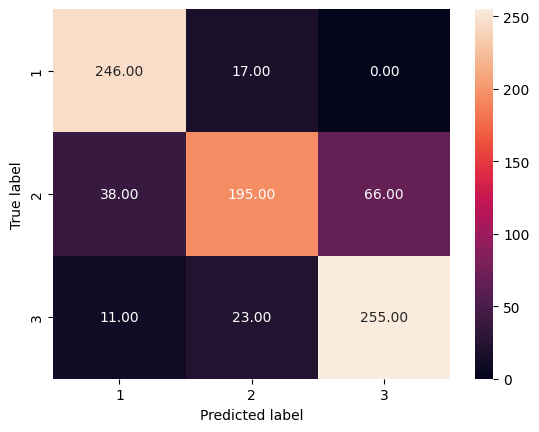

In [92]:
draw_confmatrix(pca_y_test, pca_y_predict,1,2,3, "Reduced Dimensions Using PCA ")

In [93]:
#Classification Report Of Model built on Principal Components:
print("Classification Report For Raw Data:", "\n", classification_report(pca_y_test,pca_y_predict))

Classification Report For Raw Data: 
               precision    recall  f1-score   support

           1       0.83      0.94      0.88       263
           2       0.83      0.65      0.73       299
           3       0.79      0.88      0.84       289

    accuracy                           0.82       851
   macro avg       0.82      0.82      0.82       851
weighted avg       0.82      0.82      0.81       851



## Random Forest Classifier

### Feature Importance of Raw Data

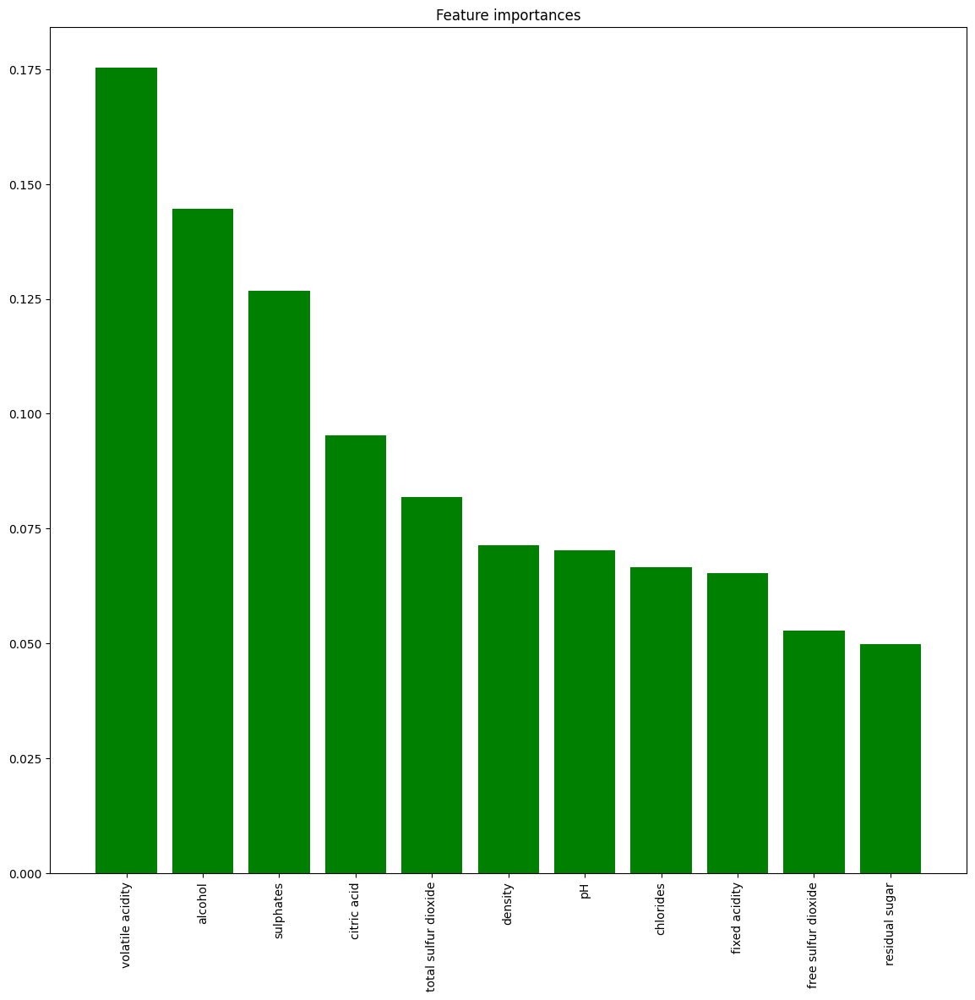

In [94]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()      
rf = rf.fit(X_train, y_train)
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
# Plot the feature importances of the forest

plt.figure(1, figsize=(14, 13))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices],
       color="g",  align="center")
plt.xticks(range(X_train.shape[1]), X_train.columns[indices],rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

In [95]:
#print highly correlated variables
corr_features =[]

for i , r in data.corr().iterrows():
    k=0 #counter
    for j in range(len(r)):
        if i!= r.index[k]:
            if r.values[k] >=0.5:
                corr_features.append([i, r.index[k], r.values[k]])
        k += 1
corr_features

[['fixed acidity', 'citric acid', 0.6731572507629235],
 ['fixed acidity', 'density', 0.6815008826691703],
 ['citric acid', 'fixed acidity', 0.6731572507629235],
 ['free sulfur dioxide', 'total sulfur dioxide', 0.6610928721834333],
 ['total sulfur dioxide', 'free sulfur dioxide', 0.6610928721834333],
 ['density', 'fixed acidity', 0.6815008826691703]]

In [96]:
X_train_rf = X_train[['alcohol','sulphates','volatile acidity','density','total sulfur dioxide','chlorides','pH','residual sugar']]
X_test_rf = X_test[['alcohol','sulphates','volatile acidity','density','total sulfur dioxide','chlorides','pH','residual sugar']]

In [97]:
rf = RandomForestClassifier()      
rf.fit(X_train_rf, y_train)
rf_y_predict = rf.predict(X_test_rf) #predict on test data

In [98]:
#Classification Report Of Model built on Principal Components:
print("Classification Report For Raw Data:", "\n", classification_report(y_test,rf_y_predict))

Classification Report For Raw Data: 
               precision    recall  f1-score   support

           1       0.98      1.00      0.99       263
           2       0.98      0.90      0.94       299
           3       0.92      0.98      0.95       289

    accuracy                           0.96       851
   macro avg       0.96      0.96      0.96       851
weighted avg       0.96      0.96      0.96       851



Confusion Matrix For : 
 Using RandomForestClassifier 
 [[263   0   0]
 [  5 268  26]
 [  0   5 284]]


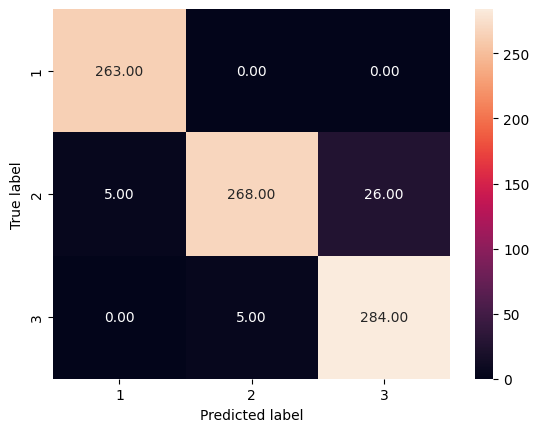

In [108]:
draw_confmatrix(y_test, rf_y_predict,1,2,3, "Using RandomForestClassifier")

## Xgboost Classifier

In [99]:
!pip install xgboost

In [100]:
from sklearn.preprocessing import LabelEncoder
# Encode the target variable
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)

In [101]:
from xgboost import XGBClassifier
xgb_model = XGBClassifier(objective='multi:softmax').fit(X_train_rf, y_train_encoded)
# predict
xgb_y_predict = xgb_model.predict(X_test_rf)
# Inverse transform the predicted labels to original class names
xgb_y_predict_org = le.inverse_transform(xgb_y_predict)

In [102]:
#Classification Report Of Model built on Principal Components:
print("Classification Report For Raw Data:", "\n", classification_report(y_test,xgb_y_predict))

Classification Report For Raw Data: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00       263
           2       0.09      0.10      0.09       299
           3       0.00      0.00      0.00       289

    accuracy                           0.03       851
   macro avg       0.02      0.02      0.02       851
weighted avg       0.03      0.03      0.03       851



#### Hyper Parameter Tuning

In [103]:
#Tuning only XGB as it has the higher accuracy
est =[]
est.append(('XGB', Pipeline([('XGB', XGBClassifier())])))

best = []

parameters = {
              'XGB': {'XGB__learning_rate': [0.1,0.2,0.3,0.4],
                         
                         'XGB__max_depth': [4,6,8],
                      'XGB__n_estimators': [100,500,1000,1500]}
             }

for i in est:
    kfold = KFold(n_splits=5, random_state=0, shuffle=True)
    grid = GridSearchCV(estimator=i[1], param_grid = parameters[i[0]], cv = kfold, n_jobs=-1)
    grid.fit(X_train, y_train_encoded)
    best.append((i[0], grid.best_score_,  grid.best_params_))

In [104]:
print(best)

[('XGB', 0.9647202503625678, {'XGB__learning_rate': 0.3, 'XGB__max_depth': 8, 'XGB__n_estimators': 1000})]


In [111]:
from xgboost import XGBClassifier
xgb_model = XGBClassifier(objective='multi:softmax',learning_rate=0.1,max_depth=8,n_estimators=1000).fit(X_train_rf, y_train_encoded)
# predict
xgb_y_predict = xgb_model.predict(X_test_rf)
# Inverse transform the predicted labels to original class names
xgb_y_predict_org = le.inverse_transform(xgb_y_predict)

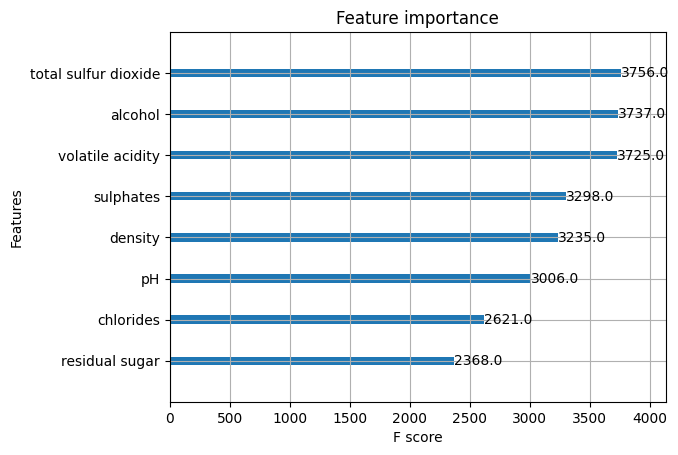

In [112]:
from xgboost import plot_importance
plot_importance(xgb_model)
plt.show()

# Choosing the Best Clssification Model

After Building 3 Models:
We can conclude that the **randomforest classifier** gives the best result when we look at the classification report with high precision, recall and f1-score.

In [113]:
#Classification Report Of Model built on Principal Components:
print("Classification Report For Raw Data:", "\n", classification_report(y_test,xgb_y_predict))

Classification Report For Raw Data: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00       263
           2       0.09      0.09      0.09       299
           3       0.00      0.00      0.00       289

    accuracy                           0.03       851
   macro avg       0.02      0.02      0.02       851
weighted avg       0.03      0.03      0.03       851



# References

https://www.analyticsvidhya.com/blog/2020/07/10-techniques-to-deal-with-class-imbalance-in-machine-learning/